# Population Animation

Animated horizontal bar chart showing Top 10 countries by population over time using `matplotlib.animation`.

## Install Libs

In [ ]:
! pip install pandas
! pip install matplotlib
! pip install IPython

## Imports

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

## Clean Data

In [3]:
df = pd.read_csv('./data/un-country-data.csv')
countries = df[df["ISO3_code"].notnull()]

columns = ["ISO3_code", "Location", "Time", "TPopulation1Jan", "TPopulation1July"]
clean_df = countries[columns]

clean_df.to_csv('./data/cleaned-data.csv', index=False);
clean_df.head();



/tmp/ipykernel_488818/211645713.py:1: DtypeWarning: Columns (0: Notes, 1: ISO3_code, 2: ISO2_code, 3: LocTypeName) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('./data/un-country-data.csv')


## Load Data

In [4]:
df = pd.read_csv('./data/cleaned-data.csv')
df.head()

,ISO3_code,Location,Time,TPopulation1Jan,TPopulation1July
0,BDI,Burundi,1950,2229.322,2254.938
1,BDI,Burundi,1951,2280.554,2305.746
2,BDI,Burundi,1952,2330.938,2355.804
3,BDI,Burundi,1953,2380.670,2405.186
4,BDI,Burundi,1954,2429.703,2454.586


## Helper Functions

In [5]:
def setup_plot_style(ax):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.tick_params(axis='y', which='both', left=False)
    ax.tick_params(axis='x', which='both', bottom=False)
    ax.set_xlabel('Total Population on 1st January')
    ax.set_title('Top 10 Countries by Population (in millions)')


def add_year_text(ax, year):
    ax.text(
        0.9, 0.1, str(year),
        transform=ax.transAxes,
        ha='center',
        fontsize=20
    )

## Create Animation

In [6]:
def create_animation(df):
    frames = df['Time'].unique()
    fig, ax = plt.subplots(figsize=(12, 6))

    def animate(frame):
        ax.clear()

        # Filter data for the selected time frame
        pop_data_frame = df[df['Time'] == frame]

        # Get top 10 countries by population
        top_countries = (
            pop_data_frame.nlargest(10, 'TPopulation1Jan')
            .sort_values('TPopulation1Jan', ascending=True)
        )

        # Horizontal bar plot
        ax.barh(
            top_countries['Location'],
            top_countries['TPopulation1Jan']
        )

        # Text labels for each bar
        for _, row in top_countries.iterrows():
            ax.text(
                row['TPopulation1Jan'],
                row['Location'],
                str(int(row['TPopulation1Jan'])),
                va='center'
            )

        setup_plot_style(ax)
        add_year_text(ax, frame)

    anim = animation.FuncAnimation(fig, animate, frames=frames, interval=200)
    return anim

## Run Animation

Display the animation inline in the notebook.

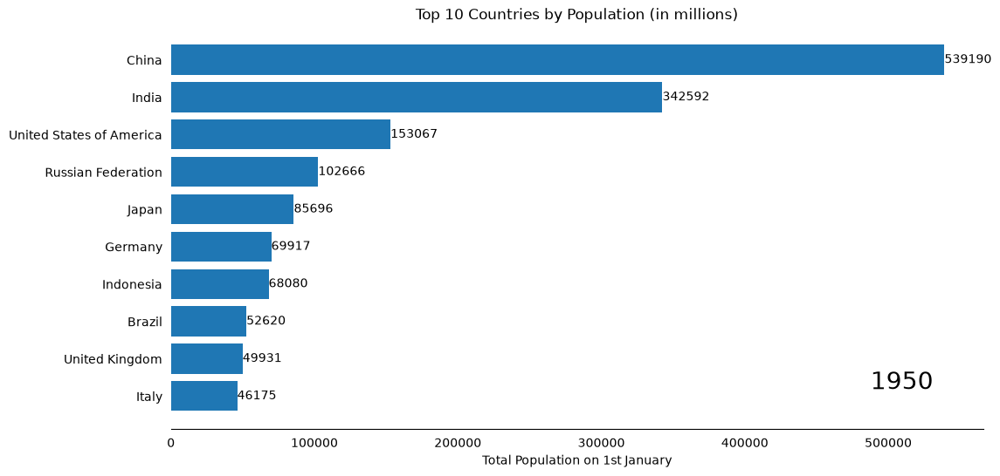

In [7]:
anim = create_animation(df)
HTML(anim.to_jshtml())